In [1]:
import numpy as np
import networkx as nx
import matplotlib.pyplot as plt
import random

class Params:
  def set_params(self):
    self.n = int(input('Введите количество вершин n'))
    self.s_node = int(input('Введите исходящую вершину (от 0 до n):'))
    self.r1, self.r2 = [int(x) for x in input('Введите левую и правую границы генерации r1 r2').split(' ')]
    self.k = int(input('Введите количество повторов k'))
    self.n_ind = int(input('Введите количество особей в поколении Ind'))
    self.p_cross = float(input('Введите вероятность кроссовера Pk'))
    self.p_mut = float(input('Введите вероятность мутации Pm'))
    
    graph = nx.complete_graph(self.n)
    for (u, v) in graph.edges():
        graph[u][v]['weight'] = np.random.randint(self.r1, self.r2) 
    self.graph = graph
    
  def get_params(self):
    return self.n, self.graph, self.s_node, self.r1, self.r2, self.p_cross, self.p_mut, self.n_ind, self.k

In [2]:
class Individual():

  def __init__(self, n, graph, fixed_node, p_mut, p_cross, num):
      self.n = n
      self.graph = graph
      self.fixed_node = fixed_node
      self.y_gens = self.get_y_gens()
      self.x_gens = self.get_x_gens()
      self.mut_prop = [*[1 for i in range(int(p_mut * 100))], *[0 for i in range(100 - int(p_mut * 100))]]
      self.cross_prop = [*[1 for i in range(int(p_cross * 100))], *[0 for i in range(100 - int(p_cross * 100))]]
      self.p_mut = p_mut
      self.p_cross = p_cross
      self.num = num
      
  def get_y_gens(self):
    nodes = np.arange(0, self.n)
    nodes = nodes[nodes != self.fixed_node]
    np.random.shuffle(nodes)
    nodes_list = nodes.tolist()
    result_list = [self.fixed_node] + nodes_list + [self.fixed_node]
    return result_list

  def get_x_gens(self):
    edges = []
    weights = []
    
    for i in range(len(self.y_gens) - 1):
      edges.append((self.y_gens[i], self.y_gens[i + 1]))

    for (u, v) in edges:
      if u == v:
        weights.append(0)
      else:
        weights.append(self.graph[min(u, v)][max(u, v)]['weight'])
    
    return weights
      
  def print_info(self):
        print(f"Генотип -->")
        print("\t" + " ".join(map(str, self.y_gens))) 
        print("\t" + " ".join(map(str, self.x_gens)))
        print(f"Приспособленность: {sum(self.x_gens)}")
        print("\n")
 
  def update_pheno(self):
    self.x_gens = self.get_x_gens()

  def mutation(self):
    if random.random() < (self.mut_prop.count(1) / 100):
        print(f"Произошла мутация (её шанс был {self.p_mut})", end='\n')

        i, j = random.sample(range(1, self.n - 1), 2)
        self.y_gens[i], self.y_gens[j] = self.y_gens[j], self.y_gens[i]
        
        print(f"Элементы на позициях {i} и {j} были обменены местами")
        print(f"Измененный x_gens: {self.x_gens}")
    else:
        print("Мутация не произошла", end='\n')

  def crossover(self, ind: 'Individual'):
    if self.cross_prop[random.randint(0, 99)] == 1:
       
        first_child = Individual(ind.n, ind.graph, ind.fixed_node, ind.p_mut, ind.p_cross, num=self.num)
        second_child = Individual(ind.n, ind.graph, ind.fixed_node, ind.p_mut, ind.p_cross, num=self.num)

        split_dot = np.random.randint(1, len(self.y_gens) - 1)
        
        def add_unique_genes(child, first_parent, second_parent):
            for gene in first_parent[split_dot:] + second_parent[split_dot:]:
                if gene not in child.y_gens:
                    child.y_gens.append(gene)
        
        first_child.y_gens = self.y_gens[:split_dot]
        second_child.y_gens = ind.y_gens[:split_dot]
        
        add_unique_genes(first_child, ind.y_gens, self.y_gens)
        add_unique_genes(second_child, self.y_gens, ind.y_gens)
        
        first_child.y_gens.append(self.fixed_node)
        second_child.y_gens.append(self.fixed_node)
        
        print(f"Прошёл кроссовер (его шанс был {self.p_cross})", end='\n')
        
        return [first_child, second_child]
    else:
        print("Кроссовер не произошёл", end='\n')
        return None

In [3]:
import networkx as nx
from itertools import permutations

class Evolution:
    def __init__(self, n, graph, fixed_node, r1, r2, p_mut, p_cross, population_size = 5, k = 3) -> None:
        self.population_size = population_size
        self.fixed_node = fixed_node
        self.graph = graph
        self.print_adj_matrix()
        
        self.population = [Individual(n, self.graph, fixed_node, p_mut, p_cross, i) for i in range(self.population_size)]
        self.num_generations = k
        self.generation_buffer = {}
        
    def print_adj_matrix(self):
        adj_matrix = nx.to_numpy_array(self.graph, weight='weight')
        print(pd.DataFrame(adj_matrix, index=self.graph.nodes(), columns=self.graph.nodes()))

    def get_random_individual(self, current_ind):
        while True:
            random_ind = random.choice(self.population)
            if random_ind != current_ind:
                return random_ind
    
    def generate_complete_graph(self, n, l1, l2):
        G = nx.complete_graph(n)
        
        for (u, v) in G.edges():
            G[u][v]['weight'] = random.randint(l1, l2)

        return G


    def print_population(self):
        for ind in self.population:
            print(f"Особь {self.population.index(ind) + 1}")
            ind.print_info()
            
    def get_childs(self, ind1, ind2):
        childs = ind1.crossover(ind2)
        if childs is not None:
            for ind in childs:
                ind.mutation()
                ind.update_pheno()
                
            ind1.update_pheno()
            childs.append(ind1)
            return childs
        else:
            print("Идёт мутация:")
            mut_ind = Individual(ind1.n, ind1.graph, ind1.fixed_node, ind1.p_mut, ind1.p_cross, num=ind1.num)
            mut_ind.y_gens = ind1.y_gens.copy()
            mut_ind.mutation()
            mut_ind.update_pheno()
            return [ind1, mut_ind]
        
    def get_best_individual(self, individuals):
        return min(individuals, key=lambda x: sum(x.x_gens))

    def get_top_in_generation(self, individuals):
        result = sorted(individuals, key=lambda x: sum(x.x_gens))
        print(f"Отсортированные особи (всего {len(result)}): ")
        return result[:self.population_size]
    
    def find_shortest_cycle(self):
        start = self.fixed_node
        current_node = start
        visited = set([start])
        path = [start]
        total_distance = 0

        while len(visited) < len(self.graph.nodes):
            neighbors = [(neighbor, data['weight']) for neighbor, data in self.graph[current_node].items() if neighbor not in visited]
            if not neighbors:
                return None, float('inf')
            next_node, weight = min(neighbors, key=lambda x: x[1])
            path.append(next_node)
            total_distance += weight
            visited.add(next_node)
            current_node = next_node
            
        if start in self.graph[current_node]:
            path.append(start)
            total_distance += self.graph[current_node][start]['weight']
        else:
            return None, float('inf')

        return path, total_distance
    
    
    def print_graph(self, nodes, path_color='red', graph_title=''):
        edges = []
        colored_edges = set() 

        for i in range(len(nodes) - 1):
            edges.append((nodes[i], nodes[i + 1]))
            colored_edges.add((nodes[i], nodes[i + 1])) 

        node_colors = ['lightblue'] * len(self.graph.nodes())
        start_node = nodes[0]
        node_colors[start_node] = 'green'

        pos = nx.circular_layout(self.graph)
        nx.draw(self.graph, pos, with_labels=True, node_size=1000, node_color=node_colors, edge_color='gray', width=2, font_size=12, font_weight='bold')
        
        nx.draw_networkx_edges(self.graph, edgelist=edges, edge_color=path_color, width=2, pos=pos)

        edge_labels = {(u, v): d['weight'] for u, v, d in self.graph.edges(data=True) if (u, v) in colored_edges or (v, u) in colored_edges}  # Обработка направленных ребер
        nx.draw_networkx_edge_labels(self.graph, pos, edge_labels=edge_labels, font_color='black')

        plt.title(graph_title)
        plt.show()


In [4]:
param_manager = Params()

param_manager.set_params()

In [5]:
params = param_manager.get_params()

In [6]:
#12, 2, 10, 40, 0.8, 0.8, 11, 11

In [10]:
param_manager.k = 100
param_manager.n_ind = 100
params = param_manager.get_params()

      0     1     2     3     4     5     6     7     8     9     10    11
0    0.0  14.0  10.0  10.0  17.0  10.0  11.0  13.0  13.0  11.0  15.0  12.0
1   14.0   0.0  13.0  15.0  15.0  15.0  11.0  15.0  11.0  16.0  19.0  10.0
2   10.0  13.0   0.0  19.0  17.0  16.0  14.0  13.0  10.0  10.0  10.0  16.0
3   10.0  15.0  19.0   0.0  12.0  12.0  14.0  16.0  18.0  11.0  12.0  19.0
4   17.0  15.0  17.0  12.0   0.0  10.0  17.0  15.0  13.0  15.0  14.0  12.0
5   10.0  15.0  16.0  12.0  10.0   0.0  13.0  18.0  11.0  16.0  12.0  19.0
6   11.0  11.0  14.0  14.0  17.0  13.0   0.0  18.0  11.0  17.0  17.0  15.0
7   13.0  15.0  13.0  16.0  15.0  18.0  18.0   0.0  11.0  11.0  10.0  17.0
8   13.0  11.0  10.0  18.0  13.0  11.0  11.0  11.0   0.0  18.0  11.0  11.0
9   11.0  16.0  10.0  11.0  15.0  16.0  17.0  11.0  18.0   0.0  19.0  16.0
10  15.0  19.0  10.0  12.0  14.0  12.0  17.0  10.0  11.0  19.0   0.0  15.0
11  12.0  10.0  16.0  19.0  12.0  19.0  15.0  17.0  11.0  16.0  15.0   0.0
Начальное распределение:


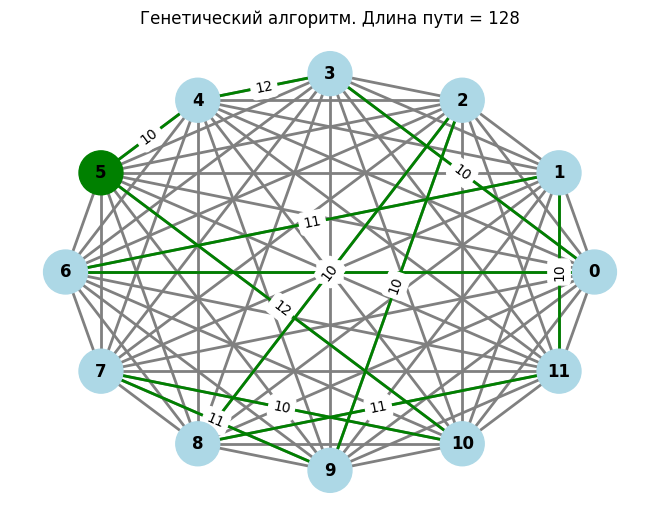

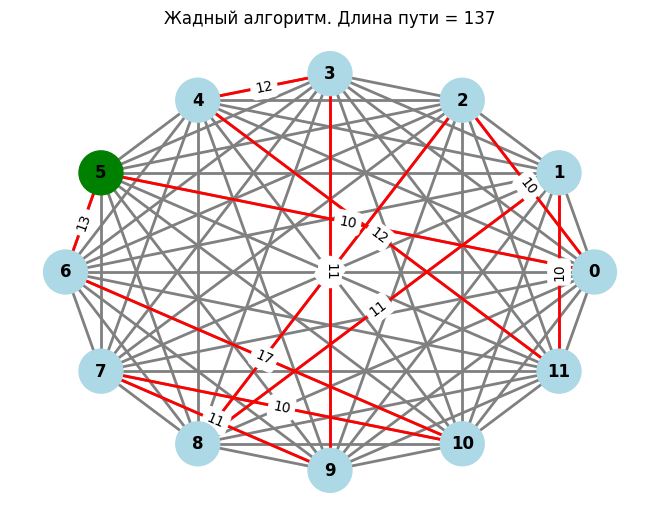

In [11]:
import random
import pandas as pd

evolution = Evolution(*params)
#evolution = Evolution(10, 4, 10, 50,  0.5, 0.5, 100, 100)
ostanova_counter = 0
last_pheno = 0
gen_counter = 0


print("Начальное распределение:")
evolution.print_population()
    
generation = 0
while True:
    print(f"Формирование нового {generation + 1}-го поколения: \n")
    print("Текущая популяция и целевые функции:", end='\n')

    for current_ind in evolution.population:
        partner_ind = evolution.get_random_individual(current_ind)

        print(f"Скрещивание особей {current_ind.num} и {partner_ind.num}")
        print(f"Особь {current_ind.num}")
        current_ind.print_info()

        print(f"Особь {partner_ind.num}")
        partner_ind.print_info()

        childs = evolution.get_childs(current_ind, partner_ind)
        [child.update_pheno() for child in childs]
        best_ind = evolution.get_best_individual(childs)
        
        print(f"Лучшая особь среди потомков:")
        best_ind.print_info()
        evolution.generation_buffer[current_ind.num] = best_ind

    print(f"Поколение {generation + 1} сформировано!")

    print(f"Лучшая особь текущего поколения:")
    best_in_gen = evolution.get_best_individual(evolution.generation_buffer.values())
    best_in_gen.print_info()
    evolution.population = list(evolution.generation_buffer.values())
        
    if last_pheno == sum(best_in_gen.x_gens):
        ostanova_counter += 1
    else:
        last_pheno = sum(best_in_gen.x_gens)
        ostanova_counter = 0

    gen_counter += 1
    print(f"Количество поколений без изменений: {ostanova_counter + 1}")

    if ostanova_counter >= evolution.num_generations - 1:
        print("Количество поколений без изменений превысило заданное значение. Обучение завершено!")
        print("Прошло полных поколений: ", gen_counter)
        break
    
    generation += 1

print("Обучение завершено!")

print("Используем жадный алгоритм:")
nodes, zhad_result = evolution.find_shortest_cycle()
print(f"Кратчайший путь жадного алгоритма: {nodes}")
print(f"Сумма кратчайшего пути жадного алгоритма: {zhad_result}")

evolution.print_graph(best_in_gen.y_gens, 'green', f'Генетический алгоритм. Длина пути = {sum(best_in_gen.x_gens)}')
evolution.print_graph(nodes, 'red', f'Жадный алгоритм. Длина пути = {zhad_result}')